In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_masks.npy')

In [3]:
images.shape

(2141, 512, 512, 1)

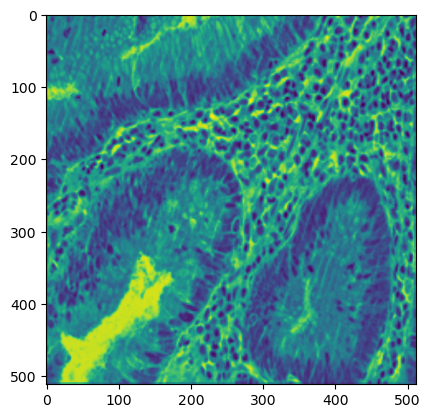

In [4]:
imshow(images[1001])

In [5]:
masks.shape

(2141, 512, 512, 1)

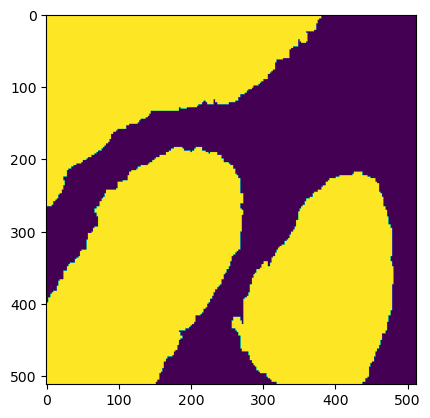

In [6]:
imshow(masks[1001])

In [7]:
import sys
sys.path.append('../')
import gp2

In [8]:
from keras import losses

In [9]:
loss_fx = losses.BCE

In [10]:
C = gp2.KUC_UNet2D(loss=loss_fx)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmp7h8stef3kuc_unet2d


In [11]:
hist = C.train(images[0:1700], masks[0:1700], images[1700:2141], masks[1700:2141], batch_size=16, patience_counter=4)

Epoch 1/100
107/107 [==============================] - 46s 328ms/step - loss: 0.5660 - dice_coeff: 0.7027 - val_loss: 0.4344 - val_dice_coeff: 0.7872
Epoch 2/100
107/107 [==============================] - 29s 271ms/step - loss: 0.4636 - dice_coeff: 0.7702 - val_loss: 0.3942 - val_dice_coeff: 0.7953
Epoch 3/100
107/107 [==============================] - 29s 270ms/step - loss: 0.4846 - dice_coeff: 0.7570 - val_loss: 0.3829 - val_dice_coeff: 0.8239
Epoch 4/100
107/107 [==============================] - 29s 271ms/step - loss: 0.4513 - dice_coeff: 0.7788 - val_loss: 0.3915 - val_dice_coeff: 0.8056
Epoch 5/100
107/107 [==============================] - 29s 270ms/step - loss: 0.4283 - dice_coeff: 0.7896 - val_loss: 0.3626 - val_dice_coeff: 0.8393
Epoch 6/100
107/107 [==============================] - 29s 269ms/step - loss: 0.4091 - dice_coeff: 0.8004 - val_loss: 0.3757 - val_dice_coeff: 0.8093
Epoch 7/100
107/107 [==============================] - 29s 270ms/step - loss: 0.3905 - dice_coeff: 0

In [12]:
def visualize_predictions(model, images, masks, num_samples=100):
    for i in range(num_samples):
        x_val, y_val = images[i], masks[i]
        y_pred, _ = model.predict(x_val[np.newaxis, ...], y_val[np.newaxis, ...])

        # Draw the input image, true mask, and predicted mask
        fig, ax = plt.subplots(nrows=1, ncols=3)
        
        ax[0].imshow(x_val)
        ax[0].title.set_text('Input Image')

        ax[1].imshow(y_val.squeeze(), cmap='gray')
        ax[1].title.set_text('True Mask')

        ax[2].imshow(y_pred.squeeze(), cmap='gray')
        ax[2].title.set_text('Predicted Mask')

        plt.show()

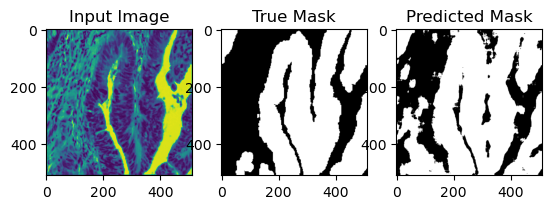

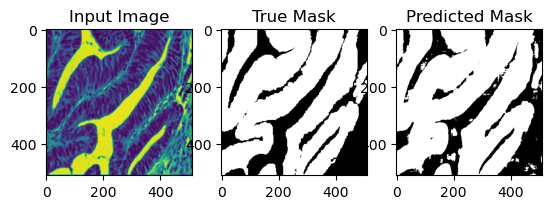

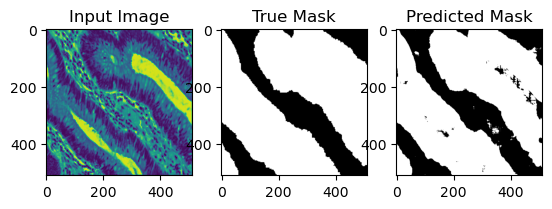

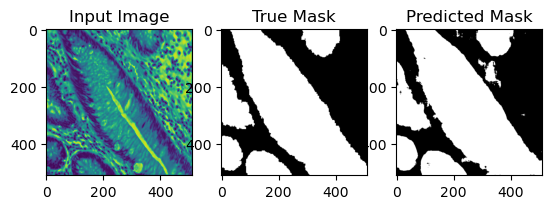

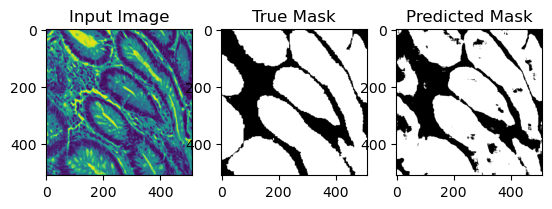

...

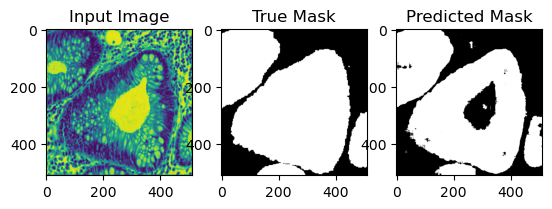

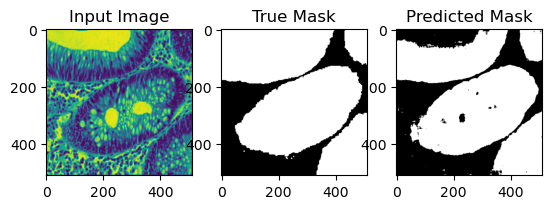

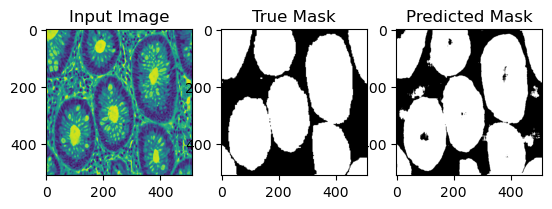

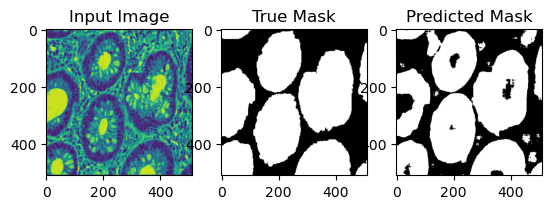

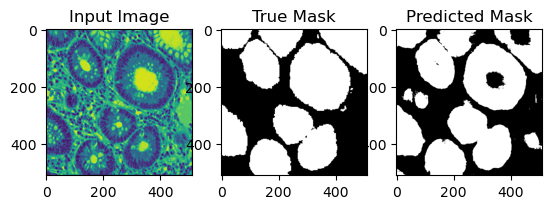

In [13]:
visualize_predictions(C, images[1700:2141], masks[1700:2141], num_samples=100)